In [1]:
import os
if "COLAB_GPU" in os.environ:
    print("[INFO] Running in Google Colab, installing requirements.")
    !pip install torch torchvision
    !pip install sentence-transformers
    !pip install PyMuPDF
    !pip install tqdm
    !pip install sentence-transformers #for embedding
    !pip install accelerate #for quantization model building
    !pip install bitsandbytes #for quantizing models (less storage space)
    !pip install flash-attn --no-build-isolation # for faster attention mechanism = faster LLM inference

[INFO] Running in Google Colab, installing requirements.
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
 

In [2]:
import os
import requests
pdf_path="human-nutrition-text.pdf"
if not os.path.exists(pdf_path):
    print("[INFO] Downloading PDF file...")
    url="https://pressbooks.oer.hawaii.edu/humannutrition2/open/download?type=pdf"
    filename=pdf_path
    response=requests.get(url)
    if response.status_code==200:
        with open(filename,"wb") as file:
            file.write(response.content)
        print(f"The file has been downloaded and saved as {filename}")
    else:
        print(f"Failed to download the file. Status code: {response.status_code}")
else:
    print("[INFO] PDF file already exists.")

[INFO] Downloading PDF file...
The file has been downloaded and saved as human-nutrition-text.pdf


In [3]:
import fitz
from tqdm.auto import tqdm

def text_formatter(text:str) -> str:
    cleaned_text=text.replace("\n", " ").strip()
    return cleaned_text
def open_and_read_pdf(pdf_path:str) -> list[dict]:
    doc=fitz.open(pdf_path)
    pages_and_texts=[]
    for page_number, page in tqdm(enumerate(doc)):
      text=page.get_text()
      text=text_formatter(text)
      pages_and_texts.append({"page_number": page_number-41,
                             "page_char_count":len(text),
                              "page_word_count":len(text.split(" ")),
                              "page_sentence_count":len(text.split(". ")),
                              "page_token_count": len(text)/4,
                              "text":text})
    return pages_and_texts
pages_and_texts=open_and_read_pdf(pdf_path)
pages_and_texts[:2]

0it [00:00, ?it/s]

[{'page_number': -41,
  'page_char_count': 29,
  'page_word_count': 4,
  'page_sentence_count': 1,
  'page_token_count': 7.25,
  'text': 'Human Nutrition: 2020 Edition'},
 {'page_number': -40,
  'page_char_count': 0,
  'page_word_count': 1,
  'page_sentence_count': 1,
  'page_token_count': 0.0,
  'text': ''}]

In [4]:
len(pages_and_texts)

1208

In [5]:
import random
random.sample(pages_and_texts,k=3)

[{'page_number': 946,
  'page_char_count': 1757,
  'page_word_count': 313,
  'page_sentence_count': 17,
  'page_token_count': 439.25,
  'text': 'workout four to five days per week, you can become more active in  simple ways—by taking the stairs instead of the elevator, by walking  more instead of driving, by going out dancing with your friends, or  by doing your household chores at a faster pace. It is not necessary  to perform at the level of a professional dancer or athlete, or to work  out for several hours every day, to see real gains from exercise. Even  slightly increased activity can lead to physical benefits, such as:  • Longer life. A regular exercise program can reduce your risk of  dying early from heart disease, certain cancers, and other  leading causes of death.  • Healthier weight. Exercise, along with a healthy, balanced  eating plan, can help you lose extra weight, maintain weight  loss, or prevent excessive weight gain.  • Cardiovascular disease prevention. Being acti

In [6]:
import pandas as pd
df=pd.DataFrame(pages_and_texts)
df.head()

,page_number,page_char_count,page_word_count,page_sentence_count,page_token_count,text
0,-41,29,4,1,7.25,Human Nutrition: 2020 Edition
1,-40,0,1,1,0.00,
2,-39,320,54,1,80.00,Human Nutrition: 2020 Edition UNIVERSITY OF ...
3,-38,212,32,1,53.00,Human Nutrition: 2020 Edition by University of...
4,-37,797,145,2,199.25,Contents Preface University of Hawai‘i at Mā...


In [7]:
df.describe().round(2)

,page_number,page_char_count,page_word_count,page_sentence_count,page_token_count
count,1208.00,1208.00,1208.00,1208.00,1208.00
mean,562.50,1148.59,198.89,9.97,287.15
std,348.86,560.44,95.75,6.19,140.11
min,-41.00,0.00,1.00,1.00,0.00
25%,260.75,762.75,134.00,4.00,190.69
50%,562.50,1232.50,215.00,10.00,308.12
75%,864.25,1605.25,271.25,14.00,401.31
max,1166.00,2308.00,429.00,32.00,577.00


In [8]:
import spacy
from spacy.lang.en import English
nlp=English()
nlp.add_pipe("sentencizer")
doc=nlp("This is a sentence. This is another sentence.")
assert len(list(doc.sents))==2
list(doc.sents)

[This is a sentence., This is another sentence.]

In [9]:
for item in tqdm(pages_and_texts):
    item["sentences"]=list(nlp(item["text"]).sents)
    item["sentences"]=[str(sent) for sent in item["sentences"]]
    item["page_sentence_count"]=len(item["sentences"])

  0%|          | 0/1208 [00:00<?, ?it/s]

In [10]:
random.sample(pages_and_texts,k=1)

[{'page_number': 1051,
  'page_char_count': 1450,
  'page_word_count': 242,
  'page_sentence_count': 15,
  'page_token_count': 362.5,
  'text': 'LDL (bad) cholesterol, it still has a positive cumulative effect on  heart health.4  The Gluten-Free Diet  The gluten-free diet helps people whose bodies cannot tolerate  gluten, a protein found in wheat, barley, and rye. One of the most  important ways to treat this condition is to avoid the problematic  foods, which is not easy. Although following a gluten-free diet is  challenging, it is prescribed for patients with gluten intolerance  and celiac disease, an autoimmune disorder with a genetic link.  People who have celiac disease cannot consume gluten products  without damaging their intestinal lining. Eating a gluten-free diet  means finding replacements for bread, cereal, pasta, and more. It  also means emphasizing fresh fruits, vegetables, and other foods  without gluten. However, it is important to note that the gluten- free trend has b

In [11]:
df=pd.DataFrame(pages_and_texts)
df.describe().round(2)

,page_number,page_char_count,page_word_count,page_sentence_count,page_token_count
count,1208.00,1208.00,1208.00,1208.00,1208.00
mean,562.50,1148.59,198.89,10.32,287.15
std,348.86,560.44,95.75,6.30,140.11
min,-41.00,0.00,1.00,0.00,0.00
25%,260.75,762.75,134.00,5.00,190.69
50%,562.50,1232.50,215.00,10.00,308.12
75%,864.25,1605.25,271.25,15.00,401.31
max,1166.00,2308.00,429.00,28.00,577.00


In [12]:
num_sentence_chunk_size=10
def split_list(input_list: list, slice_size: int) -> list[list[str]]:
    return [input_list[i:i+slice_size] for i in range(0,len(input_list),slice_size)]

for item in tqdm(pages_and_texts):
    item["sentence_chunks"]=split_list(item["sentences"],num_sentence_chunk_size)
    item["num_chunks"]=len(item["sentence_chunks"])

  0%|          | 0/1208 [00:00<?, ?it/s]

In [13]:
random.sample(pages_and_texts, k=1)

[{'page_number': 984,
  'page_char_count': 0,
  'page_word_count': 1,
  'page_sentence_count': 0,
  'page_token_count': 0.0,
  'text': '',
  'sentences': [],
  'sentence_chunks': [],
  'num_chunks': 0}]

In [14]:
df = pd.DataFrame(pages_and_texts)
df.describe().round(2)

,page_number,page_char_count,page_word_count,page_sentence_count,page_token_count,num_chunks
count,1208.00,1208.00,1208.00,1208.00,1208.00,1208.00
mean,562.50,1148.59,198.89,10.32,287.15,1.53
std,348.86,560.44,95.75,6.30,140.11,0.64
min,-41.00,0.00,1.00,0.00,0.00,0.00
25%,260.75,762.75,134.00,5.00,190.69,1.00
50%,562.50,1232.50,215.00,10.00,308.12,1.00
75%,864.25,1605.25,271.25,15.00,401.31,2.00
max,1166.00,2308.00,429.00,28.00,577.00,3.00


In [15]:
# import re

pages_and_texts[5]

{'page_number': -36,
 'page_char_count': 976,
 'page_word_count': 177,
 'page_sentence_count': 3,
 'page_token_count': 244.0,
 'text': 'Lifestyles and Nutrition  University of Hawai‘i at Mānoa Food Science and  Human Nutrition Program and Human Nutrition  Program  21  Achieving a Healthy Diet  University of Hawai‘i at Mānoa Food Science and  Human Nutrition Program and Human Nutrition  Program  30  Research and the Scientific Method  University of Hawai‘i at Mānoa Food Science and  Human Nutrition Program and Human Nutrition  Program  34  Types of Scientific Studies  University of Hawai‘i at Mānoa Food Science and  Human Nutrition Program and Human Nutrition  Program  41  Part\xa0II.\xa0Chapter 2. The Human Body  Introduction  University of Hawai‘i at Mānoa Food Science and  Human Nutrition Program and Human Nutrition  Program  55  Basic Biology, Anatomy, and Physiology  University of Hawai‘i at Mānoa Food Science and  Human Nutrition Program and Human Nutrition  Program  62  The Diges

In [16]:
import re

pages_and_chunks=[]
for item in tqdm(pages_and_texts):
    for sentence_chunk in item["sentence_chunks"]:
        chunk_dict={}
        chunk_dict["page_number"]=item["page_number"]

        joined_sentence_chunk="".join(sentence_chunk).replace("  "," ").strip()
        joined_sentence_chunk=re.sub(r'\.([A-Z])', r'. \1',joined_sentence_chunk)
        chunk_dict["sentence_chunk"]=joined_sentence_chunk

        #stats
        chunk_dict["chunk_char_count"]=len(joined_sentence_chunk)
        chunk_dict["chunk_word_count"]=len(joined_sentence_chunk.split(" "))
        chunk_dict["chunk_token_count"]=len(joined_sentence_chunk)/4
        pages_and_chunks.append(chunk_dict)
len(pages_and_chunks)

  0%|          | 0/1208 [00:00<?, ?it/s]

1843

In [17]:
random.sample(pages_and_chunks,k=2)

[{'page_number': 1011,
  'sentence_chunk': 'Protecting the Public Health UNIVERSITY OF HAWAI‘I AT MĀNOA FOOD SCIENCE AND HUMAN NUTRITION PROGRAM AND HUMAN NUTRITION PROGRAM Most foodborne infections go unreported and undiagnosed. However, the CDC estimates that about seventy-six million people in the United States become ill from foodborne pathogens or other agents every year. In North America, a number of government agencies work to educate the public about food infections and intoxications, prevent the spread of disease, and quell any major problems or outbreaks. They include the CDC, the FDA, and the USDA, among other organizations. Efforts on the Governmental Level A number of government agencies work to ensure food safety and to protect the public from foodborne illness. Food regulatory agencies work to protect the consumer and ensure the safety of our food. Food and drug regulation in the United States began in the late nineteenth century when state and local governments began to

In [18]:
df=pd.DataFrame(pages_and_chunks)
df.describe().round(2)

,page_number,chunk_char_count,chunk_word_count,chunk_token_count
count,1843.00,1843.00,1843.00,1843.00
mean,583.38,734.83,112.72,183.71
std,347.79,447.43,71.07,111.86
min,-41.00,12.00,3.00,3.00
25%,280.50,315.00,45.00,78.75
50%,586.00,746.00,114.00,186.50
75%,890.00,1118.50,173.00,279.62
max,1166.00,1831.00,297.00,457.75


In [19]:
min_token_length=30
for row in df[df["chunk_token_count"]<=min_token_length].sample(5).iterrows():
    print(f'Chunk token count: {row[1]["chunk_token_count"]} | Text : {row[1]["sentence_chunk"]}')


Chunk token count: 4.5 | Text : 708 | Introduction
Chunk token count: 19.5 | Text : 2009). Dietary Glycemic Index: Digestion and Absorption of Carbohydrates | 247
Chunk token count: 28.25 | Text : A concentration gradient is a form of potential energy, like water 172 | Electrolytes Important for Fluid Balance
Chunk token count: 24.25 | Text : These activities are available in the web-based textbook and not available in the Magnesium | 643
Chunk token count: 11.75 | Text : Accessed March 17, 2018. Sports Nutrition | 961


In [20]:
pages_and_chunks_over_min_token_len=df[df["chunk_token_count"]>min_token_length].to_dict(orient="records")
pages_and_chunks_over_min_token_len[:2]

[{'page_number': -39,
  'sentence_chunk': 'Human Nutrition: 2020 Edition UNIVERSITY OF HAWAI‘I AT MĀNOA FOOD SCIENCE AND HUMAN NUTRITION PROGRAM ALAN TITCHENAL, SKYLAR HARA, NOEMI ARCEO CAACBAY, WILLIAM MEINKE-LAU, YA-YUN YANG, MARIE KAINOA FIALKOWSKI REVILLA, JENNIFER DRAPER, GEMADY LANGFELDER, CHERYL GIBBY, CHYNA NICOLE CHUN, AND ALLISON CALABRESE',
  'chunk_char_count': 308,
  'chunk_word_count': 42,
  'chunk_token_count': 77.0},
 {'page_number': -38,
  'sentence_chunk': 'Human Nutrition: 2020 Edition by University of Hawai‘i at Mānoa Food Science and Human Nutrition Program is licensed under a Creative Commons Attribution 4.0 International License, except where otherwise noted.',
  'chunk_char_count': 210,
  'chunk_word_count': 30,
  'chunk_token_count': 52.5}]

In [21]:
from sentence_transformers import SentenceTransformer
embedding_model=SentenceTransformer(model_name_or_path="all-mpnet-base-v2",
                                    device="cpu")

sentences=[ "The Sentences Transformers library provides an easy and open-source way to create embeddings.",
    "Sentences can be embedded one by one or as a list of strings.",
    "Embeddings are one of the most powerful concepts in machine learning!",
    "Learn to use embeddings well and you'll be well on your way to being an AI engineer."
    ]

embeddings=embedding_model.encode(sentences)
embeddings_dict=dict(zip(sentences,embeddings))

for sentence,embedding in embeddings_dict.items():
    print("Sentence:",sentence)
    print("Embedding:",embedding)
    print("")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:99: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Sentence: The Sentences Transformers library provides an easy and open-source way to create embeddings.
Embedding: [-2.07982697e-02  3.03164832e-02 -2.01217849e-02  6.86484650e-02
 -2.55256221e-02 -8.47686455e-03 -2.07225574e-04 -6.32377118e-02
  2.81606894e-02 -3.33353989e-02  3.02633960e-02  5.30721806e-02
 -5.03527038e-02  2.62288321e-02  3.33313718e-02 -4.51577231e-02
  3.63044813e-02 -1.37122418e-03 -1.20171458e-02  1.14947259e-02
  5.04510924e-02  4.70856987e-02  2.11913940e-02  5.14606535e-02
 -2.03746483e-02 -3.58889401e-02 -6.67763175e-04 -2.94393823e-02
  4.95859198e-02 -1.05639677e-02 -1.52014112e-02 -1.31758570e-03
  4.48197424e-02  1.56023465e-02  8.60379430e-07 -1.21392624e-03
 -2.37978697e-02 -9.09368275e-04  7.34484056e-03 -2.53933994e-03
  5.23370504e-02 -4.68043424e-02  1.66214760e-02  4.71579395e-02
 -4.15599644e-02  9.01976076e-04  3.60277519e-02  3.42214219e-02
  9.68227163e-02  5.94829023e-02 -1.64984372e-02 -3.51249315e-02
  5.92516130e-03 -7.07903586e-04 -2.4103

In [33]:
%%time

embedding_model.to("cpu")
for item in tqdm(pages_and_chunks_over_min_token_len):
    item["embedding"]=embedding_model.encode(item["sentence_chunk"])

  0%|          | 0/1680 [00:00<?, ?it/s]

CPU times: user 22min 33s, sys: 3.73 s, total: 22min 37s
Wall time: 24min 9s


In [23]:
text_chunks=[item["sentence_chunk"] for item in pages_and_chunks_over_min_token_len]

In [24]:
text_chunk_embeddings=embedding_model.encode(text_chunks,
                                             batch_size=32,
                                             convert_to_tensor=True)
text_chunk_embeddings.shape

torch.Size([1680, 768])

In [31]:
text_chunk_embeddings

tensor([[ 0.0674,  0.0902, -0.0051,  ..., -0.0221, -0.0232,  0.0126],
        [ 0.0552,  0.0592, -0.0166,  ..., -0.0120, -0.0103,  0.0227],
        [ 0.0280,  0.0340, -0.0206,  ..., -0.0054,  0.0213,  0.0313],
        ...,
        [ 0.0771,  0.0098, -0.0122,  ..., -0.0409, -0.0752, -0.0241],
        [ 0.1030, -0.0165,  0.0083,  ..., -0.0574, -0.0283, -0.0295],
        [ 0.0864, -0.0125, -0.0113,  ..., -0.0522, -0.0337, -0.0299]])

In [37]:
pages_and_chunks_over_min_token_len

[{'page_number': -39,
  'sentence_chunk': 'Human Nutrition: 2020 Edition UNIVERSITY OF HAWAI‘I AT MĀNOA FOOD SCIENCE AND HUMAN NUTRITION PROGRAM ALAN TITCHENAL, SKYLAR HARA, NOEMI ARCEO CAACBAY, WILLIAM MEINKE-LAU, YA-YUN YANG, MARIE KAINOA FIALKOWSKI REVILLA, JENNIFER DRAPER, GEMADY LANGFELDER, CHERYL GIBBY, CHYNA NICOLE CHUN, AND ALLISON CALABRESE',
  'chunk_char_count': 308,
  'chunk_word_count': 42,
  'chunk_token_count': 77.0,
  'embedding': array([ 6.74242601e-02,  9.02279988e-02, -5.09551819e-03, -3.17545161e-02,
          7.39081874e-02,  3.51975895e-02, -1.97987445e-02,  4.67692390e-02,
          5.35727218e-02,  5.01230126e-03,  3.33928168e-02, -1.62223319e-03,
          1.76081229e-02,  3.62653174e-02, -3.16765480e-04, -1.07117714e-02,
          1.54257137e-02,  2.62176655e-02,  2.77663139e-03,  3.64942923e-02,
         -4.44109552e-02,  1.89362019e-02,  4.90117408e-02,  1.64021030e-02,
         -4.85783182e-02,  3.18282819e-03,  2.72992272e-02, -2.04754225e-03,
         -1.

In [38]:
text_chunk_and_embeddings_df=pd.DataFrame(pages_and_chunks_over_min_token_len)
embeddings_save_path="text_chunk_embeddings_df.csv"
text_chunk_and_embeddings_df.to_csv(embeddings_save_path,index=False)

In [39]:
text_chunks_and_embedding_df_load=pd.read_csv(embeddings_save_path)
text_chunks_and_embedding_df_load.head()

,page_number,sentence_chunk,chunk_char_count,chunk_word_count,chunk_token_count,embedding
0,-39,Human Nutrition: 2020 Edition UNIVERSITY OF HA...,308,42,77.00,[ 6.74242601e-02 9.02279988e-02 -5.09551819e-...
1,-38,Human Nutrition: 2020 Edition by University of...,210,30,52.50,[ 5.52156493e-02 5.92137985e-02 -1.66167784e-...
2,-37,Contents Preface University of Hawai‘i at Māno...,766,114,191.50,[ 2.79801469e-02 3.39813307e-02 -2.06427258e-...
3,-36,Lifestyles and Nutrition University of Hawai‘i...,941,142,235.25,[ 6.82566613e-02 3.81274484e-02 -8.46858509e-...
4,-35,The Cardiovascular System University of Hawai‘...,998,152,249.50,[ 3.30264196e-02 -8.49771872e-03 9.57152341e-...


In [41]:
import random
import torch
import numpy as np
import pandas as pd

device="cuda" if torch.cuda.is_available() else "cpu"

text_chunks_and_embedding_df=pd.read_csv(embeddings_save_path)
text_chunks_and_embedding_df["embedding"]=text_chunks_and_embedding_df["embedding"].apply(lambda x: np.fromstring(x.strip("[]"), sep=" "))

pages_and_chunks=text_chunks_and_embedding_df.to_dict(orient="records")

embeddings=torch.tensor(np.array(text_chunks_and_embedding_df["embedding"].tolist()),dtype=torch.float32).to(device)
embeddings.shape

torch.Size([1680, 768])

In [42]:
text_chunks_and_embedding_df.head()

,page_number,sentence_chunk,chunk_char_count,chunk_word_count,chunk_token_count,embedding
0,-39,Human Nutrition: 2020 Edition UNIVERSITY OF HA...,308,42,77.00,"[0.0674242601, 0.0902279988, -0.00509551819, -..."
1,-38,Human Nutrition: 2020 Edition by University of...,210,30,52.50,"[0.0552156493, 0.0592137985, -0.0166167784, -0..."
2,-37,Contents Preface University of Hawai‘i at Māno...,766,114,191.50,"[0.0279801469, 0.0339813307, -0.0206427258, 0...."
3,-36,Lifestyles and Nutrition University of Hawai‘i...,941,142,235.25,"[0.0682566613, 0.0381274484, -0.00846858509, -..."
4,-35,The Cardiovascular System University of Hawai‘...,998,152,249.50,"[0.0330264196, -0.00849771872, 0.00957152341, ..."


In [43]:
embeddings[0]

tensor([ 6.7424e-02,  9.0228e-02, -5.0955e-03, -3.1755e-02,  7.3908e-02,
         3.5198e-02, -1.9799e-02,  4.6769e-02,  5.3573e-02,  5.0123e-03,
         3.3393e-02, -1.6222e-03,  1.7608e-02,  3.6265e-02, -3.1677e-04,
        -1.0712e-02,  1.5426e-02,  2.6218e-02,  2.7766e-03,  3.6494e-02,
        -4.4411e-02,  1.8936e-02,  4.9012e-02,  1.6402e-02, -4.8578e-02,
         3.1828e-03,  2.7299e-02, -2.0475e-03, -1.2283e-02, -7.2805e-02,
         1.2045e-02,  1.0730e-02,  2.1000e-03, -8.1777e-02,  2.6783e-06,
        -1.8143e-02, -1.2080e-02,  2.4717e-02, -6.2747e-02,  7.3544e-02,
         2.2162e-02, -3.2877e-02, -1.8009e-02,  2.2295e-02,  5.6136e-02,
         1.7951e-03,  5.2593e-02, -3.3174e-03, -8.3387e-03, -1.0629e-02,
         2.3192e-03, -2.2393e-02, -1.5301e-02, -9.9306e-03,  4.6532e-02,
         3.5747e-02, -2.5476e-02,  2.6370e-02,  3.7491e-03, -3.8268e-02,
         2.5833e-02,  4.1287e-02,  2.5818e-02,  3.3297e-02, -2.5178e-02,
         4.5152e-02,  4.4898e-04, -9.9662e-02,  4.9

In [44]:
from sentence_transformers import util, SentenceTransformer

embedding_model = SentenceTransformer(model_name_or_path="all-mpnet-base-v2",
                                      device=device)

In [45]:
query = "macronutrients functions"
print(f"Query: {query}")

query_embedding = embedding_model.encode(query, convert_to_tensor=True)

from time import perf_counter as timer

start_time = timer()
dot_scores = util.dot_score(a=query_embedding, b=embeddings)[0]
end_time = timer()

print(f"Time take to get scores on {len(embeddings)} embeddings: {end_time-start_time:.5f} seconds.")

top_results_dot_product = torch.topk(dot_scores, k=5)
top_results_dot_product

Query: macronutrients functions
Time take to get scores on 1680 embeddings: 0.00105 seconds.


torch.return_types.topk(
values=tensor([0.6926, 0.6738, 0.6646, 0.6536, 0.6473]),
indices=tensor([42, 47, 41, 51, 46]))

In [46]:
import textwrap

def print_wrapped(text, wrap_length=80):
    wrapped_text = textwrap.fill(text, wrap_length)
    print(wrapped_text)

In [47]:
print(f"Query: '{query}'\n")
print("Results:")
for score, idx in zip(top_results_dot_product[0], top_results_dot_product[1]):
    print(f"Score: {score:.4f}")
    print("Text:")
    print_wrapped(pages_and_chunks[idx]["sentence_chunk"])
    print(f"Page number: {pages_and_chunks[idx]['page_number']}")
    print("\n")

Query: 'macronutrients functions'

Results:
Score: 0.6926
Text:
Macronutrients Nutrients that are needed in large amounts are called
macronutrients. There are three classes of macronutrients: carbohydrates,
lipids, and proteins. These can be metabolically processed into cellular energy.
The energy from macronutrients comes from their chemical bonds. This chemical
energy is converted into cellular energy that is then utilized to perform work,
allowing our bodies to conduct their basic functions. A unit of measurement of
food energy is the calorie. On nutrition food labels the amount given for
“calories” is actually equivalent to each calorie multiplied by one thousand. A
kilocalorie (one thousand calories, denoted with a small “c”) is synonymous with
the “Calorie” (with a capital “C”) on nutrition food labels. Water is also a
macronutrient in the sense that you require a large amount of it, but unlike the
other macronutrients, it does not yield calories. Carbohydrates Carbohydrates
are 

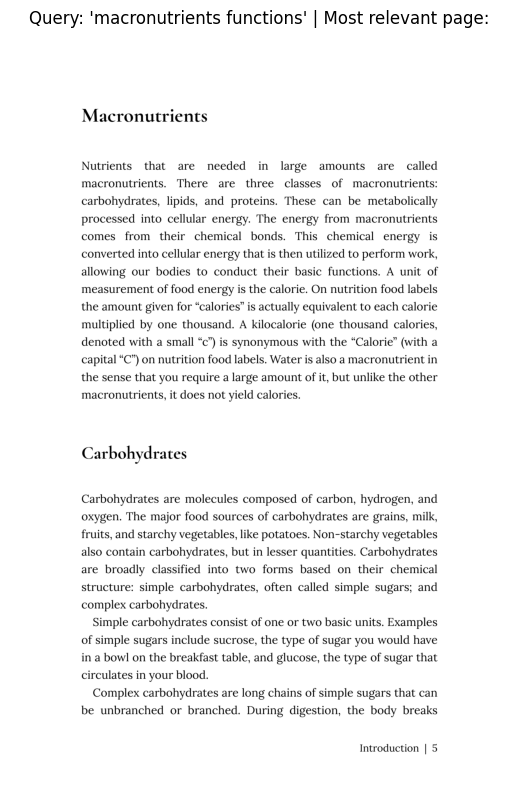

In [48]:
import fitz
pdf_path="human-nutrition-text.pdf"
doc=fitz.open(pdf_path)
page=doc.load_page(5+41)
img=page.get_pixmap(dpi=300)
img.save("page_5.png")
img_array=np.frombuffer(img.samples_mv, dtype=np.uint8).reshape((img.h, img.w, img.n))

import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
plt.imshow(img_array)
plt.title(f"Query: '{query}' | Most relevant page:")
plt.axis("off")
plt.show()

In [49]:
import torch

def dot_product(vector1, vector2):
    return torch.dot(vector1, vector2)

def cosine_similarity(vector1, vector2):
    dot_product = torch.dot(vector1, vector2)

    # Get Euclidean/L2 norm of each vector (removes the magnitude, keeps direction)
    norm_vector1 = torch.sqrt(torch.sum(vector1**2))
    norm_vector2 = torch.sqrt(torch.sum(vector2**2))

    return dot_product / (norm_vector1 * norm_vector2)

vector1 = torch.tensor([1, 2, 3], dtype=torch.float32)
vector2 = torch.tensor([1, 2, 3], dtype=torch.float32)
vector3 = torch.tensor([4, 5, 6], dtype=torch.float32)
vector4 = torch.tensor([-1, -2, -3], dtype=torch.float32)

print("Dot product between vector1 and vector2:", dot_product(vector1, vector2))
print("Dot product between vector1 and vector3:", dot_product(vector1, vector3))
print("Dot product between vector1 and vector4:", dot_product(vector1, vector4))

print("Cosine similarity between vector1 and vector2:", cosine_similarity(vector1, vector2))
print("Cosine similarity between vector1 and vector3:", cosine_similarity(vector1, vector3))
print("Cosine similarity between vector1 and vector4:", cosine_similarity(vector1, vector4))

Dot product between vector1 and vector2: tensor(14.)
Dot product between vector1 and vector3: tensor(32.)
Dot product between vector1 and vector4: tensor(-14.)
Cosine similarity between vector1 and vector2: tensor(1.0000)
Cosine similarity between vector1 and vector3: tensor(0.9746)
Cosine similarity between vector1 and vector4: tensor(-1.0000)


In [50]:
def retrieve_relevant_resources(query: str,
                                embeddings: torch.tensor,
                                model: SentenceTransformer=embedding_model,
                                n_resources_to_return: int=5,
                                print_time: bool=True):
    query_embedding = model.encode(query,
                                   convert_to_tensor=True)
    start_time = timer()
    dot_scores = util.dot_score(query_embedding, embeddings)[0]
    end_time = timer()

    if print_time:
        print(f"[INFO] Time taken to get scores on {len(embeddings)} embeddings: {end_time-start_time:.5f} seconds.")

    scores, indices = torch.topk(input=dot_scores,
                                 k=n_resources_to_return)

    return scores, indices

def print_top_results_and_scores(query: str,
                                 embeddings: torch.tensor,
                                 pages_and_chunks: list[dict]=pages_and_chunks,
                                 n_resources_to_return: int=5):
    scores, indices = retrieve_relevant_resources(query=query,
                                                  embeddings=embeddings,
                                                  n_resources_to_return=n_resources_to_return)

    print(f"Query: {query}\n")
    print("Results:")
    for score, index in zip(scores, indices):
        print(f"Score: {score:.4f}")
        print_wrapped(pages_and_chunks[index]["sentence_chunk"])
        print(f"Page number: {pages_and_chunks[index]['page_number']}")
        print("\n")

In [51]:
query = "symptoms of pellagra"

scores, indices = retrieve_relevant_resources(query=query,
                                              embeddings=embeddings)
scores, indices

[INFO] Time taken to get scores on 1680 embeddings: 0.00074 seconds.


(tensor([0.5000, 0.3741, 0.2959, 0.2793, 0.2721]),
 tensor([ 822,  853, 1536, 1555, 1531]))

In [52]:
print_top_results_and_scores(query=query,
                             embeddings=embeddings)

[INFO] Time taken to get scores on 1680 embeddings: 0.00061 seconds.
Query: symptoms of pellagra

Results:
Score: 0.5000
Niacin deficiency is commonly known as pellagra and the symptoms include
fatigue, decreased appetite, and indigestion.  These symptoms are then commonly
followed by the four D’s: diarrhea, dermatitis, dementia, and sometimes death.
Figure 9.12  Conversion of Tryptophan to Niacin Water-Soluble Vitamins | 565
Page number: 565


Score: 0.3741
car. Does it drive faster with a half-tank of gas or a full one?It does not
matter; the car drives just as fast as long as it has gas. Similarly, depletion
of B vitamins will cause problems in energy metabolism, but having more than is
required to run metabolism does not speed it up. Buyers of B-vitamin supplements
beware; B vitamins are not stored in the body and all excess will be flushed
down the toilet along with the extra money spent. B vitamins are naturally
present in numerous foods, and many other foods are enriched with th

In [57]:
import torch

device = torch.device("cpu")

if torch.cuda.is_available():
    gpu_memory_bytes = torch.cuda.get_device_properties(0).total_memory
    gpu_memory_gb = round(gpu_memory_bytes / (2**30))
    print(f"Available GPU memory: {gpu_memory_gb} GB")
else:
    try:
        cpu_memory_bytes = torch.cuda.get_device_properties(torch.device("cpu")).total_memory
        cpu_memory_gb = round(cpu_memory_bytes / (2**30))
        print(f"Available CPU memory: {cpu_memory_gb} GB")
    except RuntimeError:
        print("Unable to retrieve CPU memory information.")

Unable to retrieve CPU memory information.


In [59]:
gpu_memory_gb=12.64
use_quantization_config = False
model_id = "xlnet-base-cased"

print(f"use_quantization_config set to: {use_quantization_config}")
print(f"model_id set to: {model_id}")

GPU memory: 12.64 | Recommended model: Gemma 2B in float16 or Gemma 7B in 4-bit precision.
use_quantization_config set to: False
model_id set to: google/gemma-2b-it


In [63]:
from transformers import AutoTokenizer, AutoModelForCausalLM
from huggingface_hub import cached_download

In [71]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
from transformers.utils import is_flash_attn_2_available

# 1. Create quantization config for smaller model loading
from transformers import BitsAndBytesConfig
quantization_config = BitsAndBytesConfig(load_in_4bit=True,
                                         bnb_4bit_compute_dtype=torch.float16)


if (is_flash_attn_2_available()) and (torch.cuda.get_device_capability(0)[0] >= 8):
  attn_implementation = "flash_attention_2"
else:
  attn_implementation = "sdpa"
print(f"[INFO] Using attention implementation: {attn_implementation}")

# 2.Model
model_id = "xlnet-base-cased"
model_id = model_id
print(f"[INFO] Using model_id: {model_id}")

# 3. Instantiate tokenizer
tokenizer = AutoTokenizer.from_pretrained(pretrained_model_name_or_path=model_id)

# 4. Instantiate the model
llm_model = AutoModelForCausalLM.from_pretrained(pretrained_model_name_or_path=model_id,
                                                 torch_dtype=torch.float16,
                                                 quantization_config=quantization_config if use_quantization_config else None,
                                                 low_cpu_mem_usage=False, # use full memory
                                                 attn_implementation="eager") #attention version

if not use_quantization_config:
    llm_model.to(device)

[INFO] Using attention implementation: sdpa
[INFO] Using model_id: xlnet-base-cased


generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

In [72]:
llm_model

XLNetLMHeadModel(
  (transformer): XLNetModel(
    (word_embedding): Embedding(32000, 768)
    (layer): ModuleList(
      (0-11): 12 x XLNetLayer(
        (rel_attn): XLNetRelativeAttention(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (ff): XLNetFeedForward(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (layer_1): Linear(in_features=768, out_features=3072, bias=True)
          (layer_2): Linear(in_features=3072, out_features=768, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (activation_function): GELUActivation()
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
    )
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (lm_loss): Linear(in_features=768, out_features=32000, bias=True)
)

In [73]:
def get_model_num_params(model: torch.nn.Module):
    return sum([param.numel() for param in model.parameters()])

get_model_num_params(llm_model)

116750336

In [74]:
def get_model_mem_size(model: torch.nn.Module):
    """
    Get how much memory a PyTorch model takes up.

    See: https://discuss.pytorch.org/t/gpu-memory-that-model-uses/56822
    """
    # Get model parameters and buffer sizes
    mem_params = sum([param.nelement() * param.element_size() for param in model.parameters()])
    mem_buffers = sum([buf.nelement() * buf.element_size() for buf in model.buffers()])

    # Calculate various model sizes
    model_mem_bytes = mem_params + mem_buffers # in bytes
    model_mem_mb = model_mem_bytes / (1024**2) # in megabytes
    model_mem_gb = model_mem_bytes / (1024**3) # in gigabytes

    return {"model_mem_bytes": model_mem_bytes,
            "model_mem_mb": round(model_mem_mb, 2),
            "model_mem_gb": round(model_mem_gb, 2)}

get_model_mem_size(llm_model)

{'model_mem_bytes': 304373248, 'model_mem_mb': 290.27, 'model_mem_gb': 0.28}

In [75]:
input_text="What are the macronutrients, and what roles do they play in the human body?"
print(f"Input text:\n{input_text}")

dialogue_template=[
    {"role": "user", "content": input_text}
]

prompt=tokenizer.apply_chat_template(conversation=dialogue_template,
                                     tokenize=False,
                                     add_generation_prompt=True)
print(f"\nPrompt:\n{prompt}")

No chat template is set for this tokenizer, falling back to a default class-level template. This is very error-prone, because models are often trained with templates different from the class default! Default chat templates are a legacy feature and will be removed in Transformers v4.43, at which point any code depending on them will stop working. We recommend setting a valid chat template before then to ensure that this model continues working without issues.


Input text:
What are the macronutrients, and what roles do they play in the human body?

Prompt:
<|im_start|>user
What are the macronutrients, and what roles do they play in the human body?<|im_end|>
<|im_start|>assistant



In [82]:
%%time

input_ids = tokenizer(prompt, return_tensors="pt").to("cpu")
print(f"Model input (tokenized):\n{input_ids}\n")

llm_model=llm_model.float()
outputs = llm_model.generate(**input_ids,
                             max_new_tokens=256)
print(f"Model output (tokens):\n{outputs[0]}\n")


Model input (tokenized):
{'input_ids': tensor([[ 7739,  7505,  1490,  2732, 11119,  7505,  3151, 14401,   609,    41,
            18, 14136, 21292,    23,    19,    21,   113,  4779,   112,    63,
           354,    25,    18,   594,   458,    82,  6461,  7505,  1490,  2732,
          1936,  7505,  3151,  7739,  7505,  1490,  2732, 11119,  7505,  3151,
         10598,    23, 11034,     4,     3]]), 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])}



This is a friendly reminder - the current text generation call will exceed the model's predefined maximum length (-1). Depending on the model, you may observe exceptions, performance degradation, or nothing at all.


Model output (tokens):
tensor([ 7739,  7505,  1490,  2732, 11119,  7505,  3151, 14401,   609,    41,
           18, 14136, 21292,    23,    19,    21,   113,  4779,   112,    63,
          354,    25,    18,   594,   458,    82,  6461,  7505,  1490,  2732,
         1936,  7505,  3151,  7739,  7505,  1490,  2732, 11119,  7505,  3151,
        10598,    23, 11034,     4,     3,  1490,  2732,  1936,  7505,  3151,
           23,    23,    23,    23,    23,    23,    23,    23,    23,    23,
           23,    23,    23,    23,    23,    23,    23,    23,    23,    23,
           23,    23,    23,    23,    23,    23,    23,    23,    23,    23,
           23,    23,    23,    23,    23,    23,    23,    23,    23,    23,
           23,    23,    23,    23,    23,    23,    23,    23,    23,    23,
           23,    23,    23,    23,    23,    23,    23,    23,    23,    23,
           23,    23,    23,    23,    23,    23,    23,    23,    23,    23,
           23,    23,    23,    23,    23

In [83]:
outputs_decoded = tokenizer.decode(outputs[0])
print(f"Model output (decoded):\n{outputs_decoded}\n")

Model output (decoded):
<|im_start|>user What are the macronutrients, and what roles do they play in the human body?<|im_end|> <|im_start|>assistant<sep><cls>im_end|>sssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssss



In [84]:
print(f"Input text: {input_text}\n")
print(f"Output text:\n{outputs_decoded.replace(prompt, '').replace('<bos>', '').replace('<eos>', '')}")

Input text: What are the macronutrients, and what roles do they play in the human body?

Output text:
<|im_start|>user What are the macronutrients, and what roles do they play in the human body?<|im_end|> <|im_start|>assistant<sep><cls>im_end|>sssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssssss


In [85]:
# Nutrition-style questions generated with GPT4
gpt4_questions = [
    "What are the macronutrients, and what roles do they play in the human body?",
    "How do vitamins and minerals differ in their roles and importance for health?",
    "Describe the process of digestion and absorption of nutrients in the human body.",
    "What role does fibre play in digestion? Name five fibre containing foods.",
    "Explain the concept of energy balance and its importance in weight management."
]

# Manually created question list
manual_questions = [
    "How often should infants be breastfed?",
    "What are symptoms of pellagra?",
    "How does saliva help with digestion?",
    "What is the RDI for protein per day?",
    "water soluble vitamins"
]

query_list = gpt4_questions + manual_questions

In [86]:
def prompt_formatter(query: str,
                     context_items: list[dict]) -> str:
    """
    Augments query with text-based context from context_items.
    """
    # Join context items into one dotted paragraph
    context = "- " + "\n- ".join([item["sentence_chunk"] for item in context_items])

    # Create a base prompt with examples to help the model
    # Note: this is very customizable, I've chosen to use 3 examples of the answer style we'd like.
    # We could also write this in a txt file and import it in if we wanted.
    base_prompt = """Based on the following context items, please answer the query.
Give yourself room to think by extracting relevant passages from the context before answering the query.
Don't return the thinking, only return the answer.
Make sure your answers are as explanatory as possible.
Use the following examples as reference for the ideal answer style.
\nExample 1:
Query: What are the fat-soluble vitamins?
Answer: The fat-soluble vitamins include Vitamin A, Vitamin D, Vitamin E, and Vitamin K. These vitamins are absorbed along with fats in the diet and can be stored in the body's fatty tissue and liver for later use. Vitamin A is important for vision, immune function, and skin health. Vitamin D plays a critical role in calcium absorption and bone health. Vitamin E acts as an antioxidant, protecting cells from damage. Vitamin K is essential for blood clotting and bone metabolism.
\nExample 2:
Query: What are the causes of type 2 diabetes?
Answer: Type 2 diabetes is often associated with overnutrition, particularly the overconsumption of calories leading to obesity. Factors include a diet high in refined sugars and saturated fats, which can lead to insulin resistance, a condition where the body's cells do not respond effectively to insulin. Over time, the pancreas cannot produce enough insulin to manage blood sugar levels, resulting in type 2 diabetes. Additionally, excessive caloric intake without sufficient physical activity exacerbates the risk by promoting weight gain and fat accumulation, particularly around the abdomen, further contributing to insulin resistance.
\nExample 3:
Query: What is the importance of hydration for physical performance?
Answer: Hydration is crucial for physical performance because water plays key roles in maintaining blood volume, regulating body temperature, and ensuring the transport of nutrients and oxygen to cells. Adequate hydration is essential for optimal muscle function, endurance, and recovery. Dehydration can lead to decreased performance, fatigue, and increased risk of heat-related illnesses, such as heat stroke. Drinking sufficient water before, during, and after exercise helps ensure peak physical performance and recovery.
\nNow use the following context items to answer the user query:
{context}
\nRelevant passages: <extract relevant passages from the context here>
User query: {query}
Answer:"""

    # Update base prompt with context items and query
    base_prompt = base_prompt.format(context=context, query=query)

    # Create prompt template for instruction-tuned model
    dialogue_template = [
        {"role": "user",
        "content": base_prompt}
    ]

    # Apply the chat template
    prompt = tokenizer.apply_chat_template(conversation=dialogue_template,
                                          tokenize=False,
                                          add_generation_prompt=True)
    return prompt

In [87]:
query = random.choice(query_list)
print(f"Query: {query}")

# Get relevant resources
scores, indices = retrieve_relevant_resources(query=query,
                                              embeddings=embeddings)

# Create a list of context items
context_items = [pages_and_chunks[i] for i in indices]

# Format prompt with context items
prompt = prompt_formatter(query=query,
                          context_items=context_items)
print(prompt)

Query: What role does fibre play in digestion? Name five fibre containing foods.
[INFO] Time taken to get scores on 1680 embeddings: 0.00201 seconds.
<|im_start|>user
Based on the following context items, please answer the query.
Give yourself room to think by extracting relevant passages from the context before answering the query.
Don't return the thinking, only return the answer.
Make sure your answers are as explanatory as possible.
Use the following examples as reference for the ideal answer style.

Example 1:
Query: What are the fat-soluble vitamins?
Answer: The fat-soluble vitamins include Vitamin A, Vitamin D, Vitamin E, and Vitamin K. These vitamins are absorbed along with fats in the diet and can be stored in the body's fatty tissue and liver for later use. Vitamin A is important for vision, immune function, and skin health. Vitamin D plays a critical role in calcium absorption and bone health. Vitamin E acts as an antioxidant, protecting cells from damage. Vitamin K is essen

In [89]:
%%time

input_ids = tokenizer(prompt, return_tensors="pt").to("cpu")

# Generate an output of tokens
outputs = llm_model.generate(**input_ids,
                             temperature=0.7, # lower temperature = more deterministic outputs, higher temperature = more creative outputs
                             do_sample=True, # whether or not to use sampling, see https://huyenchip.com/2024/01/16/sampling.html for more
                             max_new_tokens=256) # how many new tokens to generate from prompt

# Turn the output tokens into text
output_text = tokenizer.decode(outputs[0])

print(f"Query: {query}")
print(f"RAG answer:\n{output_text.replace(prompt, '')}")

Query: What role does fibre play in digestion? Name five fibre containing foods.
RAG answer:
<|im_start|>user Based on the following context items, please answer the query. Give yourself room to think by extracting relevant passages from the context before answering the query. Don't return the thinking, only return the answer. Make sure your answers are as explanatory as possible. Use the following examples as reference for the ideal answer style. Example 1: Query: What are the fat-soluble vitamins? Answer: The fat-soluble vitamins include Vitamin A, Vitamin D, Vitamin E, and Vitamin K. These vitamins are absorbed along with fats in the diet and can be stored in the body's fatty tissue and liver for later use. Vitamin A is important for vision, immune function, and skin health. Vitamin D plays a critical role in calcium absorption and bone health. Vitamin E acts as an antioxidant, protecting cells from damage. Vitamin K is essential for blood clotting and bone metabolism. Example 2: Qu

In [92]:
def ask(query,
        temperature=0.7,
        max_new_tokens=512,
        format_answer_text=True,
        return_answer_only=True):
    """
    Takes a query, finds relevant resources/context and generates an answer to the query based on the relevant resources.
    """

    # Get just the scores and indices of top related results
    scores, indices = retrieve_relevant_resources(query=query,
                                                  embeddings=embeddings)

    # Create a list of context items
    context_items = [pages_and_chunks[i] for i in indices]

    # Add score to context item
    for i, item in enumerate(context_items):
        item["score"] = scores[i].cpu() # return score back to CPU

    # Format the prompt with context items
    prompt = prompt_formatter(query=query,
                              context_items=context_items)

    # Tokenize the prompt
    input_ids = tokenizer(prompt, return_tensors="pt").to("cpu")

    # Generate an output of tokens
    outputs = llm_model.generate(**input_ids,
                                 temperature=temperature,
                                 do_sample=True,
                                 max_new_tokens=max_new_tokens)

    # Turn the output tokens into text
    output_text = tokenizer.decode(outputs[0])

    if format_answer_text:
        # Replace special tokens and unnecessary help message
        output_text = output_text.replace(prompt, "").replace("<bos>", "").replace("<eos>", "").replace("Sure, here is the answer to the user query:\n\n", "")

    # Only return the answer without the context items
    if return_answer_only:
        return output_text

    return output_text, context_items

In [93]:
query = random.choice(query_list)
print(f"Query: {query}")

# Answer query with context and return context
answer, context_items = ask(query=query,
                            temperature=0.7,
                            max_new_tokens=512,
                            return_answer_only=False)

print(f"Answer:\n")
print_wrapped(answer)
print(f"Context items:")
context_items

Query: How does saliva help with digestion?
[INFO] Time taken to get scores on 1680 embeddings: 0.00103 seconds.
Answer:

<|im_start|>user Based on the following context items, please answer the query.
Give yourself room to think by extracting relevant passages from the context
before answering the query. Don't return the thinking, only return the answer.
Make sure your answers are as explanatory as possible. Use the following
examples as reference for the ideal answer style. Example 1: Query: What are the
fat-soluble vitamins? Answer: The fat-soluble vitamins include Vitamin A,
Vitamin D, Vitamin E, and Vitamin K. These vitamins are absorbed along with fats
in the diet and can be stored in the body's fatty tissue and liver for later
use. Vitamin A is important for vision, immune function, and skin health.
Vitamin D plays a critical role in calcium absorption and bone health. Vitamin E
acts as an antioxidant, protecting cells from damage. Vitamin K is essential for
blood clotting and b

[{'page_number': 240,
  'sentence_chunk': 'Digestion and Absorption of Carbohydrates UNIVERSITY OF HAWAI‘I AT MĀNOA FOOD SCIENCE AND HUMAN NUTRITION PROGRAM AND HUMAN NUTRITION PROGRAM From the Mouth to the Stomach The mechanical and chemical digestion of carbohydrates begins in the mouth. Chewing, also known as mastication, crumbles the carbohydrate foods into smaller and smaller pieces. The salivary glands in the oral cavity secrete saliva that coats the food particles. Saliva contains the enzyme, salivary amylase. This enzyme breaks the bonds between the monomeric sugar units of disaccharides, oligosaccharides, and starches. The salivary amylase breaks down amylose and amylopectin into smaller chains of glucose, called dextrins and maltose. The increased concentration of maltose in the mouth that results from the mechanical and chemical breakdown of starches in whole grains is what enhances their sweetness. Only about five percent of starches are broken down in the mouth. (This is a

In [94]:
"Local RAG workflow complete!"

'Local RAG workflow complete!'